In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
from tensorflow.keras.metrics import categorical_accuracy
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Permute, Bidirectional, BatchNormalization, Conv2D, Dense, Dropout, ELU, Flatten, MaxPool2D, TimeDistributed, GRU
from tensorflow.keras.regularizers import L1L2
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.initializers import lecun_uniform
from tensorflow.keras.optimizers import Adam
from tensorflow.compat.v1.keras.layers import CuDNNLSTM
import numpy as np
import matplotlib.pyplot as plt 
import numpy as np
import pandas as pd
import keras
from keras.layers import Conv2D,LSTM,BatchNormalization,MaxPooling2D,Reshape

In [3]:
import numpy as np
import random
from sklearn.linear_model import LinearRegression
from scipy import signal
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook

'''
This file contains helpful functions to preprocess data, such as cropping, subsampling, continuous wavelet transform, fourier transform.  
'''


def crop_data_sequentially(X,y,person, sample_len = 750, stride = 100): 
    '''
    Function that creates cropped data sequentially using given length and stride 
    INPUTS: 
    X - EEG data (num_trials, num_eeg_electrodes, time_bins,1) 
    y - target data corresponding to correct motor imagery task (num_trials, )
    person - subject performing task, ranging from 0-8 (num_trials, )
    sample_len - length of cropped sample
    stride - distance between crops 
    OUTPUT:
    X_cropped - cropped EEG data (num_samples, num_eeg_electrodes, time_bins) with 
                num_samples_per_trial = (num_time_bins - sample_len)/stride + 1
                num_samples = num_trials * num_samples_per_trial
    y_cropped - cropped target data (num_samples, )
    person_cropped - subject performing task from cropped data, ranging from 0-8 (num_samples, )
    '''   
    
    # helpful params
    num_trials,num_eeg_electrodes,num_time_bins,_ = X.shape
    num_samples_per_trial = int((num_time_bins-sample_len)/stride + 1)
    num_samples = int(num_trials*((num_time_bins-sample_len)/stride + 1))

    X_cropped = np.zeros((num_samples,num_eeg_electrodes,sample_len,1))
    y_cropped = np.zeros((num_samples,))
    person_cropped = np.zeros((num_samples,))

    for i,trial in enumerate(X):
        strt_idx = i*num_samples_per_trial
        crop = [trial[:,x*stride:x*stride+sample_len,:] for x in range(num_samples_per_trial)]
        X_cropped[strt_idx:strt_idx+num_samples_per_trial]= crop
        y_cropped[strt_idx:strt_idx+num_samples_per_trial] = [y[i]]*num_samples_per_trial
        person_cropped[strt_idx:strt_idx+num_samples_per_trial] = [person[i]]*num_samples_per_trial
    
    return X_cropped, y_cropped, person_cropped


def crop_data_random(X,y,person,sample_len=750,min_start_ind=0,num_crops=3,seed=None): 
    '''
    Function that creates cropped data from random starting indicies 
    INPUTS: 
    X - EEG data (num_trials, num_eeg_electrodes, time_bins,1) 
    y - target data corresponding to correct motor imagery task (num_trials, )
    person - subject performing task, ranging from 0-8 (num_trials, )
    sample_len - length of cropped sample
    min_start_ind - minimum starting index for crop to begin at 
    num_crops - number of crops to be used per trial 
    seed - seed to be used for random cropping
    OUTPUT:
    X_cropped - cropped EEG data (num_trials*num_crops, num_eeg_electrodes, time_bins) with er_trial
    y_cropped - cropped target data (num_trials*num_crops, )
    person_cropped - subject performing task from cropped data, ranging from 0-8 (num_trials*num_crops, )
    '''     
    if seed != None: 
        random.seed(seed)
    
    # helpful params
    num_trials,num_eeg_electrodes,num_time_bins,_ = X.shape
    
    X_cropped = np.zeros((num_trials*num_crops,num_eeg_electrodes,sample_len,1))
    y_cropped = np.zeros((num_trials*num_crops,))
    person_cropped = np.zeros((num_trials*num_crops,))

    for i,trial in enumerate(X):            
        strt_idxs = np.random.uniform(min_start_ind,num_time_bins-sample_len,num_crops)
        strt_idxs = strt_idxs.astype(int)
        crop = [trial[:,strt_idxs[k]:strt_idxs[k]+sample_len,:] for k in range(num_crops)]
        X_cropped[i*num_crops:i*num_crops+num_crops]= crop
        y_cropped[i*num_crops:i*num_crops+num_crops] = [y[i]]*num_crops
        person_cropped[i*num_crops:i*num_crops+num_crops] = [person[i]]*num_crops
    
    return X_cropped, y_cropped, person_cropped

def morlet_wavelet_transform(X,fs=250,freq_range=(1,15),freq_bins=100,w=5):
    ''' 
    Discrete continous wavelet transform of eeg data convolved with complex morlet wavelet
    INPUTS:
    X - EEG data (num_trials, num_eeg_electrodes, time_bins,1)
    fs - sampling rate in Hz
    freq_range - tuple containing min and max freq range to perform analysis within
    freq_bins - number of points between freq range being analyzed 
    w - Omega0 for complex morlet wavelet
    OUTPUTS: 
    X_cwt - Wavlet transformed eeg data (num_trials, num_eeg_electrodes,freq_bins,time_bins)
    '''
    
    N_trials,N_eegs,time_bins= X.shape
    
    # values for cwt
    freq = np.linspace(freq_range[0],freq_range[1],freq_bins)
    widths = w * fs / (2 * freq * np.pi) 
    X_cwt = np.zeros((N_trials,N_eegs,widths.shape[0],time_bins))
    
    print('Performing discrete CWT convolutions...')
    for trial in tqdm_notebook(range(N_trials), desc='Trials'):
        for eeg in tqdm_notebook(range(N_eegs), desc='EEG Channel', leave=False): 
            X_cwt[trial,eeg,:,:] = np.abs(signal.cwt(np.squeeze(X[trial,eeg,:,]),signal.morlet2,widths,w=w))

    return X_cwt

# subsampling eeg data function  
def subsample_data(X,y,person,sample_every=3):
    '''
    Subsamples the data to create more trials. Used as a data augmentation method.
    Returns trials along axis=0 with truncated time length based on sampling rate,
    the modified task and person labels

    Inputs:
    X: Input data of size (trials, eegs, timebins, 1)
    y: labels of input data specifying task number of size(trials,)
    person: labels of input data specifying subject number
    sample_every: Integer specifying sampling rate over time bins
    '''
    num_trials,num_eegs,num_time_bins,_ = X.shape
    assert num_time_bins%sample_every==0, 'Time length not divisible by sampling rate'
    
    #allocate size of output arrays
    X_subsample = np.empty((int(num_trials*sample_every),num_eegs,num_time_bins//sample_every,1))
    y_subsample = np.empty(int(num_trials*sample_every),)
    person_subsample = np.empty(int(num_trials*sample_every),)

    for i in range(sample_every):
        strt_idx = int(i*num_trials)
        X_subsample[strt_idx:strt_idx+num_trials] = X[:,:,i::sample_every,:]
        y_subsample[strt_idx:strt_idx+num_trials] = np.squeeze(y)
        person_subsample[strt_idx:strt_idx+num_trials] = np.squeeze(person)

    return X_subsample,y_subsample, person_subsample

def stft_data(X,window_size=64,stride=24,freq=(0,30),draw=False):
    ''' 
    Short-time-Fourier transform (STFT) function
    INPUTS:
    X - EEG data (num_trials, num_eeg_electrodes, time_bins,1)
    window_size - fixed # of time bins to analyze frequency components within
    stride - distance between starting position of adjacent windows
    freq - frequency range to obtain spectral power components
    OUTPUTS: 
    X_stft - STFT transformed eeg data (num_trials, num_eeg_electrodes*freq_bins,time_bins,1)
    num_freq - number of frequency bins
    num_time - number of time bins
    '''
    fs = 250
    num_trials, num_eegs, N,_ = X.shape
    assert (N-window_size)/stride%1==0,'Window size and stride not valid for length of data'

    f, t, Zxx = signal.stft(X[0,0,:,:], fs=fs, axis=-2,nperseg=window_size,noverlap=window_size-stride)

    wanted_freq = np.where(np.logical_and(f>=freq[0],f<=freq[1]))[0]
    num_freq = wanted_freq.shape[0]
    num_time = t.shape[0]

    X_stft = np.empty((int(num_trials), int(num_freq*num_eegs),int(num_time),1))
    for i in range(num_trials):
        #for j in range(num_eegs):
        f, t, Zxx = signal.stft(X[i,:,:,:], fs=fs, axis=-2,nperseg=window_size,noverlap=window_size-stride)
        wanted_Zxx = Zxx[:,wanted_freq,:,:]
        wanted_Zxx = np.reshape(np.transpose(wanted_Zxx,(0,1,3,2)),(num_freq*num_eegs,num_time,1))
        if draw==True:
            draw_f = np.repeat(np.expand_dims(f[wanted_freq],axis=1),num_eegs,axis=1).T.flatten()
            plt.pcolormesh(t, range(draw_f.shape[0]), np.abs(np.squeeze(wanted_Zxx)))
            plt.title('STFT Magnitude')
            plt.ylabel('Frequency [Hz]')
            plt.xlabel('Time [sec]')
            plt.show()
        X_stft[i] = wanted_Zxx

    return X_stft, num_freq, num_time

In [4]:
import os
import numpy as np
import random

# Function to EEG data, provided by EE C247 class
def load_data(dir_path): 
    X_test = np.load(os.path.join(dir_path,"X_test.npy"))
    X_test = np.expand_dims(X_test,axis=-1)

    y_test = np.load(os.path.join(dir_path,"y_test.npy"))
    y_test -= np.amin(y_test)

    person_train_valid = np.load(os.path.join(dir_path,"person_train_valid.npy"))

    X_train_valid = np.load(os.path.join(dir_path,"X_train_valid.npy"))
    X_train_valid = np.expand_dims(X_train_valid,axis=-1)

    y_train_valid = np.load(os.path.join(dir_path,"y_train_valid.npy"))
    y_train_valid -= np.amin(y_train_valid)

    person_test = np.load(os.path.join(dir_path,"person_test.npy"))

    return X_test, y_test, person_train_valid, X_train_valid, y_train_valid, person_test

def split_data_by_subject(X,y,person): 
    '''
    Function to split data by subject
    INPUT: 
    X - EEG data (num_trials, num_eeg_electrodes, time_bins) 
    y - target data corresponding to correct motor imagery task (num_trials, )
    person - subject performing task, ranging from 0-8 (num_trials, )
    OUTPUT:
    X_subject - EEG data by subject (num_subject, num_trials, num_eeg_electrodes, time_bins)
    y_subject - target data by subject (num_subject, num_trials)
    person_separated - subject performing task separated for utility 
    '''
    
    # ensure y and person dims are correct
    if y.ndim == 2: y = np.squeeze(y)
    if person.ndim == 2: person = np.squeeze(person) 
        
    
    #split data in to subjects
    X_subject = [X[person==i] for i in range(9)]
    y_subject = [y[person==i] for i in range(9)]
    person_separated = [person[person==i] for i in range(9)] 
    
    return X_subject, y_subject, person_separated
    
def split_data_by_task(X,y,person): 
    '''
    Function that splits data by target task
    INPUT: 
    X - EEG data (num_trials, num_eeg_electrodes, time_bins) 
    y - target data corresponding to correct motor imagery task (num_trials, )
    person - subject performing task, ranging from 0-8 (num_trials, )
    OUTPUT:
    X_task - EEG data by task (num_task, num_trials, num_eeg_electrodes, time_bins)
    y_subject - target data by subject (num_task, num_trials)
    person_separated - subject performing task (num_task,num_trials) 
    '''
    
    # ensure y and person dims are correct
    if y.ndim == 2: y = np.squeeze(y)
    if person.ndim == 2: person = np.squeeze(person) 
        
    #split data in to tasks
    X_task = [X[y==i] for i in range(4)]
    y_task = [y[y==i] for i in range(4)]
    person_task = [person[y==i] for i in range(4)] 
    
    return X_task, y_task, person_task
    

In [5]:
def data_prep(X,y,sub_sample,average,noise,p_train):
    
    total_X = None
    total_y = None
    
    # Trimming the data (sample,22,1000) -> (sample,22,500)
    X = X[:,:,0:500]
    print('Shape of X after trimming:',X.shape)
    
    # Maxpooling the data (sample,22,1000) -> (sample,22,500/sub_sample)
    X_max = np.max(X.reshape(X.shape[0], X.shape[1], -1, sub_sample), axis=3)
    
    
    total_X = X_max
    total_y = y
    total_p_train = p_train
  
    print('Shape of X after maxpooling:',total_X.shape)
    
    # Averaging + noise 
    X_average = np.mean(X.reshape(X.shape[0], X.shape[1], -1, average),axis=3)
    X_average = X_average + np.random.normal(0.0, 0.5, X_average.shape)
    
    total_X = np.vstack((total_X, X_average))
    total_y = np.hstack((total_y, y))
    total_p_train = np.hstack((total_p_train,p_train))
    print('Shape of X after averaging+noise and concatenating:',total_X.shape)
    
    # Subsampling
    
    for i in range(sub_sample):
        
        X_subsample = X[:, :, i::sub_sample] + \
                            (np.random.normal(0.0, 0.5, X[:, :,i::sub_sample].shape) if noise else 0.0)
            
        total_X = np.vstack((total_X, X_subsample))
        total_y = np.hstack((total_y, y))
        total_p_train = np.hstack((total_p_train,p_train))
    
    print('Shape of X after subsampling and concatenating:',total_X.shape)
    return total_X,total_y,total_p_train

In [6]:
# load data
import numpy as np
import random
import matplotlib.pyplot as plt
from datetime import datetime
from sklearn import preprocessing

X_test = np.load("/content/drive/MyDrive/project/project_data/X_test.npy")
y_test = np.load("/content/drive/MyDrive/project/project_data/y_test.npy")
person_train_valid = np.load("/content/drive/MyDrive/project/project_data/person_train_valid.npy")
X_train_valid = np.load("/content/drive/MyDrive/project/project_data/X_train_valid.npy")
y_train_valid = np.load("/content/drive/MyDrive/project/project_data/y_train_valid.npy")
person_test = np.load("/content/drive/MyDrive/project/project_data/person_test.npy")


person_train_valid = np.squeeze(person_train_valid)
person_test = np.squeeze(person_test)
print ('Training/Valid data shape: {}'.format(X_train_valid.shape))
print ('Test data shape: {}'.format(X_test.shape))
print ('Training/Valid target shape: {}'.format(y_train_valid.shape))
print ('Test target shape: {}'.format(y_test.shape))
print ('Person train/valid shape: {}'.format(person_train_valid.shape))
print ('Person test shape: {}'.format(person_test.shape))

Training/Valid data shape: (2115, 22, 1000)
Test data shape: (443, 22, 1000)
Training/Valid target shape: (2115,)
Test target shape: (443,)
Person train/valid shape: (2115,)
Person test shape: (443,)


In [7]:
## Preprocessing the dataset
X_train_valid_prep,y_train_valid_prep,person_train_prep = data_prep(X_train_valid,y_train_valid,2,2,True,person_train_valid)
X_test_prep,y_test_prep,person_test_prep = data_prep(X_test,y_test,2,2,True,person_test)
X_train_valid_prep = X_train_valid_prep[:,:,0:200]
X_test_prep = X_test_prep[:,:,0:200]
print(person_train_prep.shape)


Shape of X after trimming: (2115, 22, 500)
Shape of X after maxpooling: (2115, 22, 250)
Shape of X after averaging+noise and concatenating: (4230, 22, 250)
Shape of X after subsampling and concatenating: (8460, 22, 250)
Shape of X after trimming: (443, 22, 500)
Shape of X after maxpooling: (443, 22, 250)
Shape of X after averaging+noise and concatenating: (886, 22, 250)
Shape of X after subsampling and concatenating: (1772, 22, 250)
(8460,)


In [8]:
# # Turn labels into categories, i.e. y values of 0-3
# le = preprocessing.LabelEncoder()
# le.fit(y_train_valid_prep)
# y_train_valid_classes = le.transform(y_train_valid_prep)
# y_test_classes = le.transform(y_test_prep)

In [9]:
from sklearn import preprocessing
from scipy import signal 
import operator

subj = [0]
eegs = [0,7,9,11,19]

X_train, y_train, person_train = split_data_by_subject(X_train_valid_prep, y_train_valid_prep, person_train_prep)

#only get wanted subjects from X_train rather than have all subjects
X_train = operator.itemgetter(*subj)(X_train)
y_train = operator.itemgetter(*subj)(y_train)

X_train = X_train[:,eegs,:]

print('Shapes: x = {}, y = {}'.format(X_train.shape, y_train.shape))

# wavelet transform 
N_trials,N_eeg,N_bins = X_train.shape
fs = 250
freq_bins = 50
X_train_cwt = morlet_wavelet_transform(X_train,fs=fs,freq_range=(1,20),freq_bins=freq_bins,w=6)
# reshape to input to CNN
X_train_cwt = np.swapaxes(np.swapaxes(X_train_cwt,1,3),1,2)
# scale between -1 and 1 too mimic output of generator
X_train_cwt_norm = 2 * (X_train_cwt - np.min(X_train_cwt,axis=0) ) / (np.max(X_train_cwt,axis=0) - np.min(X_train_cwt,axis=0)) - 1

print('X_train_cwt_norm = {}'.format(X_train_cwt_norm.shape))


Shapes: x = (948, 5, 200), y = (948,)
Performing discrete CWT convolutions...


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:106: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


Trials:   0%|          | 0/948 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:107: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

X_train_cwt_norm = (948, 50, 200, 5)


In [10]:
#load the artificial data and append all of it to the training data
# split_art_data = 4
y_train -= 769
# for task in range(4):
#   pickle_file = os.path.join(project_fname,'X_artificial_task{}_subj0_eegs5.npy'.format(task))
#   trials = np.load(pickle_file)
#   N=trials.shape[0]
#   X_train_cwt_norm = np.append(X_train_cwt_norm,trials[:N//split_art_data],axis=0)
#   y_train = np.append(y_train,np.ones((N//split_art_data))*task)
print(X_train_cwt_norm.shape)
print(y_train.shape)

rand_idx = np.random.permutation(X_train_cwt_norm.shape[0])
split = int(X_train_cwt_norm.shape[0] * 0.80)


# Create randomized train and validation dataset split
X_train = X_train_cwt_norm[rand_idx][:split]
y_train_new = y_train[rand_idx][:split]
# person_train = person_train_valid[rand_idx][:split]

X_valid = X_train_cwt_norm[rand_idx][split:]
y_valid = y_train[rand_idx][split:]
# person_valid = person_train_valid[rand_idx][split:]

(948, 50, 200, 5)
(948,)


In [11]:
X_valid.shape

(190, 50, 200, 5)

In [12]:
y_valid.shape

(190,)

In [13]:
X_train.shape

(758, 50, 200, 5)

In [19]:
model = Sequential()

# Conv. block 1
model.add(Conv2D(filters=25, kernel_size=(10,1), padding='same', activation='elu', input_shape=(50,200,5)))
model.add(MaxPooling2D(pool_size=(3,1), padding='same')) 

model.add(BatchNormalization())
model.add(ELU())
model.add(Dropout(0.3))

# Conv. block 2
model.add(Conv2D(filters=50, kernel_size=(10,1), padding='same', activation='elu'))
#model.add(MaxPooling2D(pool_size=(3,1), padding='same'))

model.add(BatchNormalization())
model.add(ELU())
model.add(Dropout(0.3))

# Conv. block 3
model.add(Conv2D(filters=100, kernel_size=(10,1), padding='same', activation='elu'))
#model.add(MaxPooling2D(pool_size=(3,1), padding='same'))

model.add(BatchNormalization())
model.add(ELU())
model.add(Dropout(0.3))


model.add((Flatten())) # Adding a flattening operation 
model.add(Dense((100)))
model.add(Reshape((100,1))) # Reshape my output of FC layer so that it's compatible
model.add((Bidirectional(GRU(100, input_shape=(100,1), return_sequences=False))))
model.add(Dropout(0.3))

model.add((Flatten())) # Adding a flattening operation 
model.add(Dense((100)))
model.add(Reshape((100,1))) # Reshape my output of FC layer so that it's compatible
model.add((Bidirectional(GRU(10, input_shape=(100,1), return_sequences=False))))
model.add(Dropout(0.3))

# Output layer with Softmax activation 
model.add(Dense(4, kernel_regularizer=L1L2(l1=0, l2=0.01), activation='softmax')) # Output FC layer with softmax activation


# Printing the model summary
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 50, 200, 25)       1275      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 17, 200, 25)      0         
 2D)                                                             
                                                                 
 batch_normalization_3 (Batc  (None, 17, 200, 25)      100       
 hNormalization)                                                 
                                                                 
 elu_3 (ELU)                 (None, 17, 200, 25)       0         
                                                                 
 dropout_5 (Dropout)         (None, 17, 200, 25)       0         
                                                                 
 conv2d_4 (Conv2D)           (None, 17, 200, 50)      

In [20]:
from keras.layers import Dense, Activation, Flatten,Dropout
# Model parameters
learning_rate = 1e-3
epochs = 50
opt = Adam(lr=learning_rate)

# Compiling the model
model.compile(loss='categorical_crossentropy',
                 optimizer=opt,
                 metrics=['accuracy'])

# Training and validating the model
hybrid_cnn_lstm_model_results = model.fit(X_train,
             to_categorical(y_train_new,4),
             batch_size=64,
             epochs=epochs,
             validation_data=(X_valid, to_categorical(y_valid,4)), verbose=True)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/50
12/12 [==============================] - 12s 394ms/step - loss: 1.4506 - accuracy: 0.2929 - val_loss: 1.4419 - val_accuracy: 0.2579
Epoch 2/50
12/12 [==============================] - 3s 242ms/step - loss: 1.3778 - accuracy: 0.3720 - val_loss: 1.4165 - val_accuracy: 0.3000
Epoch 3/50
12/12 [==============================] - 3s 241ms/step - loss: 1.2923 - accuracy: 0.4195 - val_loss: 1.3971 - val_accuracy: 0.2947
Epoch 4/50
12/12 [==============================] - 3s 241ms/step - loss: 1.2049 - accuracy: 0.4565 - val_loss: 1.4057 - val_accuracy: 0.2842
Epoch 5/50
12/12 [==============================] - 3s 240ms/step - loss: 1.1508 - accuracy: 0.4828 - val_loss: 1.5261 - val_accuracy: 0.2842
Epoch 6/50
12/12 [==============================] - 3s 241ms/step - loss: 1.0470 - accuracy: 0.5343 - val_loss: 1.6280 - val_accuracy: 0.3000
Epoch 7/50
12/12 [==============================] - 3s 239ms/step - loss: 0.9642 - accuracy: 0.6016 - val_loss: 1.5737 - val_accuracy: 0.3526
Epoch

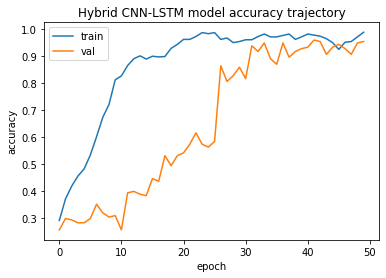

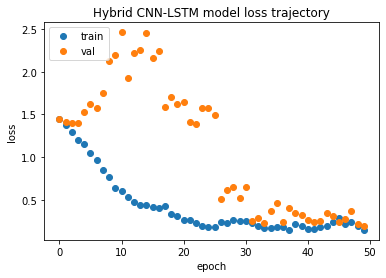

In [21]:
import matplotlib.pyplot as plt

# Plotting accuracy trajectory
plt.plot(hybrid_cnn_lstm_model_results.history['accuracy'])
plt.plot(hybrid_cnn_lstm_model_results.history['val_accuracy'])
plt.title('Hybrid CNN-LSTM model accuracy trajectory')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

# Plotting loss trajectory
plt.plot(hybrid_cnn_lstm_model_results.history['loss'],'o')
plt.plot(hybrid_cnn_lstm_model_results.history['val_loss'],'o')
plt.title('Hybrid CNN-LSTM model loss trajectory')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [22]:
from sklearn import preprocessing
from scipy import signal 
import operator

subj = [0]
eegs = [0,7,9,11,19]

X_test1,y_test1, person_test1 = split_data_by_subject(X_test_prep, y_test_prep,person_test_prep)
#only get wanted subjects from X_test1 rather than have all subjects
X_test1 = operator.itemgetter(*subj)(X_test1)
y_test1 = operator.itemgetter(*subj)(y_test1)

X_test1 = X_test1[:,eegs,:]

print('Shapes: x = {}, y = {}'.format(X_test1.shape, y_test1.shape))

# wavelet transform 
N_trials,N_eeg,N_bins = X_test1.shape
fs = 250
freq_bins = 50
X_test_cwt = morlet_wavelet_transform(X_test1,fs=fs,freq_range=(1,20),freq_bins=freq_bins,w=6)
# reshape to input to CNN
X_test_cwt = np.swapaxes(np.swapaxes(X_test_cwt,1,3),1,2)
# scale between -1 and 1 too mimic output of generator
X_test_cwt_norm = 2 * (X_test_cwt - np.min(X_test_cwt,axis=0) ) / (np.max(X_test_cwt,axis=0) - np.min(X_test_cwt,axis=0)) - 1

print('X_test_cwt_norm = {}'.format(X_test_cwt_norm.shape))


Shapes: x = (200, 5, 200), y = (200,)
Performing discrete CWT convolutions...


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:106: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


Trials:   0%|          | 0/200 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:107: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

EEG Channel:   0%|          | 0/5 [00:00<?, ?it/s]

X_test_cwt_norm = (200, 50, 200, 5)


In [23]:
## Testing the model
y_test1 -= 769
hybrid_cnn_lstm_score = model.evaluate(X_test_cwt_norm, to_categorical(y_test1,4), verbose=0)
print('Test accuracy of the hybrid CRNN model:',hybrid_cnn_lstm_score[1])

Test accuracy of the hybrid CRNN model: 0.25999999046325684
